SimVis Practice

STEP 1: Import Data

In [1]:
import pandas as pd
import glob
import os

In [2]:
cwd = os.getcwd()
print(cwd)

/mnt/c/Users/Josh


In [3]:
files = glob.glob('SimVis/sample_data_1k/*.csv')
print(files)

['SimVis/sample_data_1k/allergies.csv', 'SimVis/sample_data_1k/careplans.csv', 'SimVis/sample_data_1k/conditions.csv', 'SimVis/sample_data_1k/encounters.csv', 'SimVis/sample_data_1k/imaging_studies.csv', 'SimVis/sample_data_1k/immunizations.csv', 'SimVis/sample_data_1k/medications.csv', 'SimVis/sample_data_1k/organizations.csv', 'SimVis/sample_data_1k/patients.csv', 'SimVis/sample_data_1k/payers.csv', 'SimVis/sample_data_1k/payer_transitions.csv', 'SimVis/sample_data_1k/procedures.csv', 'SimVis/sample_data_1k/providers.csv']


In [4]:
filename = []
for i in range(0,len(files),1):
    x = files[i].rsplit(".",1)[0]
    x = x.rsplit("/",1)[1]
    filename.append(x)

In [5]:
d = {}
for i in range(0,len(filename),1):
    d[filename[i]] = pd.read_csv(files[i])

In [6]:
for keys in d:
    print(keys)

allergies
careplans
conditions
encounters
imaging_studies
immunizations
medications
organizations
patients
payers
payer_transitions
procedures
providers


In [7]:
#print(d['medications'])
print(type(d['medications']))

<class 'pandas.core.frame.DataFrame'>


In [8]:
print(d['medications'].iloc[0])

START                                                       1995-11-16
STOP                                                               NaN
PATIENT                           3603cd65-53a3-424b-bc82-76204326510d
PAYER                             d47b3510-2895-3b70-9897-342d681c769d
ENCOUNTER                         f5ddf34a-85c6-4f03-9c82-34e25fde945d
CODE                                                            999969
DESCRIPTION          Amlodipine 5 MG / Hydrochlorothiazide 12.5 MG ...
BASE_COST                                                       263.49
PAYER_COVERAGE                                                       0
DISPENSES                                                          290
TOTALCOST                                                      76412.1
REASONCODE                                                  5.9621e+07
REASONDESCRIPTION                                         Hypertension
Name: 0, dtype: object


In [9]:
#Headers of table 'medications'
list(d['medications'])

['START',
 'STOP',
 'PATIENT',
 'PAYER',
 'ENCOUNTER',
 'CODE',
 'DESCRIPTION',
 'BASE_COST',
 'PAYER_COVERAGE',
 'DISPENSES',
 'TOTALCOST',
 'REASONCODE',
 'REASONDESCRIPTION']

STEP 2:
    In this step, we check the number of appearences of each feature across all tables, and the name of each table.

In [10]:
#Check the appearences of same-name labels
label = {}
for keys in d:
    header = list(d[keys])
    for i in range(0,len(header),1):
        if header[i] not in label:
            label[header[i]] = [1]
            label[header[i]].append(keys)
        else:
            label[header[i]][0] += 1
            label[header[i]].append(keys)

for key in label:
    print(key, label[key])

START [5, 'allergies', 'careplans', 'conditions', 'encounters', 'medications']
STOP [5, 'allergies', 'careplans', 'conditions', 'encounters', 'medications']
PATIENT [9, 'allergies', 'careplans', 'conditions', 'encounters', 'imaging_studies', 'immunizations', 'medications', 'payer_transitions', 'procedures']
ENCOUNTER [7, 'allergies', 'careplans', 'conditions', 'imaging_studies', 'immunizations', 'medications', 'procedures']
CODE [7, 'allergies', 'careplans', 'conditions', 'encounters', 'immunizations', 'medications', 'procedures']
DESCRIPTION [7, 'allergies', 'careplans', 'conditions', 'encounters', 'immunizations', 'medications', 'procedures']
Id [7, 'careplans', 'encounters', 'imaging_studies', 'organizations', 'patients', 'payers', 'providers']
REASONCODE [4, 'careplans', 'encounters', 'medications', 'procedures']
REASONDESCRIPTION [4, 'careplans', 'encounters', 'medications', 'procedures']
PROVIDER [1, 'encounters']
PAYER [3, 'encounters', 'medications', 'payer_transitions']
ENCOUN

In [11]:
for key, value in d.items():
        print(key, list(value))

allergies ['START', 'STOP', 'PATIENT', 'ENCOUNTER', 'CODE', 'DESCRIPTION']
careplans ['Id', 'START', 'STOP', 'PATIENT', 'ENCOUNTER', 'CODE', 'DESCRIPTION', 'REASONCODE', 'REASONDESCRIPTION']
conditions ['START', 'STOP', 'PATIENT', 'ENCOUNTER', 'CODE', 'DESCRIPTION']
encounters ['Id', 'START', 'STOP', 'PATIENT', 'PROVIDER', 'PAYER', 'ENCOUNTERCLASS', 'CODE', 'DESCRIPTION', 'BASE_ENCOUNTER_COST', 'TOTAL_CLAIM_COST', 'PAYER_COVERAGE', 'REASONCODE', 'REASONDESCRIPTION']
imaging_studies ['Id', 'DATE', 'PATIENT', 'ENCOUNTER', 'BODYSITE_CODE', 'BODYSITE_DESCRIPTION', 'MODALITY_CODE', 'MODALITY_DESCRIPTION', 'SOP_CODE', 'SOP_DESCRIPTION']
immunizations ['DATE', 'PATIENT', 'ENCOUNTER', 'CODE', 'DESCRIPTION', 'BASE_COST']
medications ['START', 'STOP', 'PATIENT', 'PAYER', 'ENCOUNTER', 'CODE', 'DESCRIPTION', 'BASE_COST', 'PAYER_COVERAGE', 'DISPENSES', 'TOTALCOST', 'REASONCODE', 'REASONDESCRIPTION']
organizations ['Id', 'NAME', 'ADDRESS', 'CITY', 'STATE', 'ZIP', 'LAT', 'LON', 'PHONE', 'REVENUE', 'U

In [12]:
x = pd.merge(d['allergies'],d['medications'],on='PATIENT')
x.shape

(4394, 18)

In [13]:
d['providers'].head()

,Id,ORGANIZATION,NAME,GENDER,SPECIALITY,ADDRESS,CITY,STATE,ZIP,LAT,LON,UTILIZATION
0,0000016d-3a85-4cca-0000-000000000000,ef58ea08-d883-3957-8300-150554edc8fb,Beatriz277 Ortega866,F,GENERAL PRACTICE,60 HOSPITAL ROAD,LEOMINSTER,MA,01453,42.520838,-71.770876,478
1,0000016d-3a85-4cca-0000-00000000000a,69176529-fd1f-3b3f-abce-a0a3626769eb,Buford910 Feil794,M,GENERAL PRACTICE,330 MOUNT AUBURN STREET,CAMBRIDGE,MA,02138,42.375967,-71.118275,1199
2,0000016d-3a85-4cca-0000-000000000014,5e765f2b-e908-3888-9fc7-df2cb87beb58,Therese102 Bahringer146,F,GENERAL PRACTICE,211 PARK STREET,ATTLEBORO,MA,02703,41.931653,-71.294503,1348
3,0000016d-3a85-4cca-0000-00000000001e,f1fbcbfb-fcfa-3bd2-b7f4-df20f1b3c3a4,Cedrick207 Lind531,M,GENERAL PRACTICE,ONE GENERAL STREET,LAWRENCE,MA,01842,42.700273,-71.161357,1923
4,0000016d-3a85-4cca-0000-000000000028,e002090d-4e92-300e-b41e-7d1f21dee4c6,José3 Valentín837,M,GENERAL PRACTICE,1493 CAMBRIDGE STREET,CAMBRIDGE,MA,02138,42.375967,-71.118275,1098


In [14]:
d['organizations'].head()

,Id,NAME,ADDRESS,CITY,STATE,ZIP,LAT,LON,PHONE,REVENUE,UTILIZATION
0,ef58ea08-d883-3957-8300-150554edc8fb,HEALTHALLIANCE HOSPITALS INC,60 HOSPITAL ROAD,LEOMINSTER,MA,01453,42.520838,-71.770876,9784662000,60266.05,478
1,69176529-fd1f-3b3f-abce-a0a3626769eb,MOUNT AUBURN HOSPITAL,330 MOUNT AUBURN STREET,CAMBRIDGE,MA,02138,42.375967,-71.118275,6174923500,151453.01,1199
2,5e765f2b-e908-3888-9fc7-df2cb87beb58,STURDY MEMORIAL HOSPITAL,211 PARK STREET,ATTLEBORO,MA,02703,41.931653,-71.294503,5082225200,170827.01,1348
3,f1fbcbfb-fcfa-3bd2-b7f4-df20f1b3c3a4,LAWRENCE GENERAL HOSPITAL,ONE GENERAL STREET,LAWRENCE,MA,01842,42.700273,-71.161357,9786834000,241322.46,1923
4,e002090d-4e92-300e-b41e-7d1f21dee4c6,CAMBRIDGE HEALTH ALLIANCE,1493 CAMBRIDGE STREET,CAMBRIDGE,MA,02138,42.375967,-71.118275,6176652300,137374.57,1098


In [36]:
df1 = pd.merge(d['conditions'], d['medications'], how='inner',on='PATIENT')
#df1.head()
df1_col = df1.shape[0]
df1_row = df1.shape[1]
list(df1)



['START_x',
 'STOP_x',
 'PATIENT',
 'ENCOUNTER_x',
 'CODE_x',
 'DESCRIPTION_x',
 'START_y',
 'STOP_y',
 'PAYER',
 'ENCOUNTER_y',
 'CODE_y',
 'DESCRIPTION_y',
 'BASE_COST',
 'PAYER_COVERAGE',
 'DISPENSES',
 'TOTALCOST',
 'REASONCODE',
 'REASONDESCRIPTION']

In [37]:
len(df1['DESCRIPTION_x'].unique())

137

In [38]:
len(df1['DESCRIPTION_y'].unique())

151

In [43]:
#find in-unique condition & its medications
n = df1['DESCRIPTION_y'].unique()
x = df1['DESCRIPTION_x']
d = {}
dup = {}
for i in range(0,len(n),1):
    if n[i] not in d:
        d[n[i]] = 1
for k, v in d.items():
    print(k,v)
    '''
for i in range(0,df1_col,1):
    if x[i] in d & d[x[i]] == 1:
        d[n[i]] = d['DESCRIPTION_y'][i]
    elif x[i] in d & d[x[i]] == d['DESCRIPTION_y'][i]:
        continue
    elif x[i] in d & d[x[i]] != d['DESCRIPTION_y'][i]:
        dup[x[i]] = [d['DESCRIPTION_y'][i],d[x[i]]]
    else:
        d[x[i]] = 1
        '''

Amlodipine 5 MG / Hydrochlorothiazide 12.5 MG / Olmesartan medoxomil 20 MG 1
Acetaminophen 325 MG Oral Tablet 1
Amoxicillin 250 MG / Clavulanate 125 MG Oral Tablet 1
1 ML Epinephrine 1 MG/ML Injection 1
3 ML Amiodarone hydrocholoride 50 MG/ML Prefilled Syringe 1
Atropine Sulfate 1 MG/ML Injectable Solution 1
Cefuroxime 250 MG Oral Tablet 1
Ibuprofen 100 MG Oral Tablet 1
Acetaminophen 160 MG Oral Tablet 1
Jolivette 28 Day Pack 1
Errin 28 Day Pack 1
Acetaminophen 21.7 MG/ML / Dextromethorphan Hydrobromide 1 MG/ML / doxylamine succinate 0.417 MG/ML Oral Solution 1
Camila 28 Day Pack 1
Mirena 52 MG Intrauterine System 1
Seasonique 91 Day Pack 1
Trinessa 28 Day Pack 1
Liletta 52 MG Intrauterine System 1
Fexofenadine hydrochloride 30 MG Oral Tablet 1
NDA020800 0.3 ML Epinephrine 1 MG/ML Auto-Injector 1
predniSONE 5 MG Oral Tablet 1
24 HR Metformin hydrochloride 500 MG Extended Release Oral Tablet 1
Penicillin V Potassium 250 MG Oral Tablet 1
Acetaminophen 300 MG / HYDROcodone Bitartrate 5 MG

In [39]:
df1['DESCRIPTION_y'][100]

'Mirena 52 MG Intrauterine System'

In [23]:
import matplotlib as mp

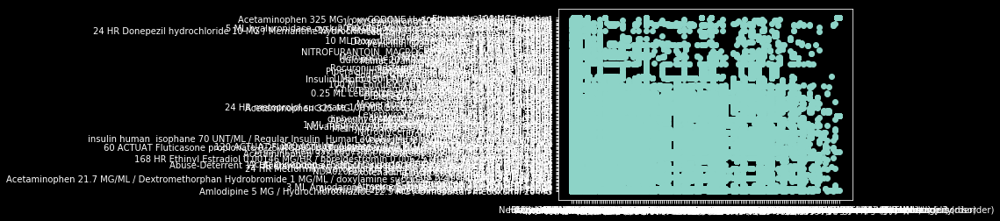

In [26]:
mp.pyplot.scatter(df1['DESCRIPTION_x'],df1['DESCRIPTION_y'])

In [27]:
mp.pyplot.bar(df1['DESCRIPTION_x'],df1['DESCRIPTION_y'])

KeyboardInterrupt: 